<a href="https://colab.research.google.com/github/shumshersubashgautam/Lunar-ML-Planetary_Albedo-mercury/blob/main/Machine_Learning_Model_for_the_Albedo_of_Mercury.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import re
import cv2
import urllib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import xgboost as xgb 

from sklearn.metrics import *
from skimage.filters import gaussian

In [2]:
np.random.seed(42)

In [3]:
#@title
def map_splitter(map_):
    '''Splits input map in two and returns the two halves as FLATTENED dataframes'''
    half_maps = np.hsplit(map_, 2) # split numpy array in two pieces
    left = pd.DataFrame(half_maps[0].flatten()) # we need to flatten each piece in order to process it later on
    right = pd.DataFrame(half_maps[1].flatten()) # turning them into pd.dataframes will help us later on

    return left, right

In [4]:
#@title
def map_scoring(y_test, preds, verbose=True, plots=True):
    '''Returns multiple scoring metrics and plots for lunar ML predictions'''
    
    # define the metrics
    residuals = y_test - preds
    mse = mean_squared_error(y_test, preds)
    rmse = mean_squared_error(y_test, preds, squared = False)
    mae = mean_absolute_error(y_test, preds)
    rsq = r2_score(y_test, preds)

    # verbose = False does not return metric numbers
    if verbose: 
        print("MSE:" + repr(mse))
        print("RMSE:" + repr(rmse))
        print("MAE:" + repr(mae))
        print("r^2:" + repr(rsq))

    # plots = False does not return plots
    if plots:

        # the inputs are flattened so we unflatten them
        predimg = preds.reshape(360, -1) 
        resimg = residuals.values.reshape(360, -1)
        yimg = y_test.values.reshape(360, -1)

        # we want all of our maps to be on the same color scale
        # here, we define the range of this color scale
        plotmin = 0
        plotmax = albedo.max()

        # our plots are going to be on a 1-by-4 grid
        fig, axs = plt.subplots(1, 4, figsize=(30, 5))

        # predicted image
        im0 = axs[0].imshow(preds.reshape(360, -1), vmin = plotmin, vmax = plotmax)
        axs[0].text(0, 0, "Predicted Image", fontsize=15)
        axs[0].autoscale(False)
        fig.colorbar(im0, ax=axs[0])

        # diff between predicted and target image
        im1 = axs[1].imshow(residuals.values.reshape(360, -1), cmap = "seismic", vmin = -0.25, vmax = 0.25) 
        axs[1].text(0, 0, "Diff Predicted and Target Image", fontsize=15)
        axs[1].autoscale(False)
        fig.colorbar(im1, ax=axs[1])

        # target image for reference
        im2 = axs[2].imshow(y_test.values.reshape(360, -1), vmin = plotmin, vmax = plotmax)
        axs[2].text(0, 0, "Target Image", fontsize=15)
        axs[2].autoscale(False)
        fig.colorbar(im2, ax=axs[2])

        # residuals vs fits (WARNING: MIGHT NOT WORK ON GOOGLE COLLAB DUE TO RAM CONSTRAINTS!)
        axs[3].scatter(residuals, preds)
        axs[3].text(axs[3].get_xlim()[0], axs[3].get_ylim()[1], "Residuals vs. Fits", fontsize=15)

        plt.show()

    return mse, rmse, mae, rsq, residuals

In [5]:
#@title
def helper_sigmas(srange, mse, rmse, mae, rsq, residuals):
    '''Helps us visualise how different error metrics change as sigma changes in 
    Gaussian blurring'''
    fig, axs = plt.subplots(1, 5, figsize=(30, 5))

    axs[0].plot(srange, mses)
    axs[0].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[0].set_ylabel("Mean Square Error")

    axs[1].plot(srange, rmses)
    axs[1].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[1].set_ylabel("Root MSE")

    axs[2].plot(srange, maes)
    axs[2].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[2].set_ylabel("Mean Absolute Error")

    axs[3].plot(srange, rsqs)
    axs[3].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[3].set_ylabel("R-Squared")

    axs[4].plot(srange, [abs(res) for res in residuals])
    axs[4].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[4].set_ylabel("Residuals of the albedos")

    plt.show()

In [6]:
#@title
def helper_ksize(srange, mse, rmse, mae, rsq, residuals):
    '''Helps us visualise how different error metrics change as kernel size
    changes in Gaussian blurring'''
    fig, axs = plt.subplots(1, 5, figsize=(30, 5))

    axs[0].plot(srange, mses)
    axs[0].set_xlabel("Kernel Size")
    axs[0].set_ylabel("Mean Square Error")

    axs[1].plot(srange, rmses)
    axs[1].set_xlabel("Kernel Size")
    axs[1].set_ylabel("Root MSE")

    axs[2].plot(srange, maes)
    axs[2].set_xlabel("Kernel Size")
    axs[2].set_ylabel("Mean Absolute Error")

    axs[3].plot(srange, rsqs)
    axs[3].set_xlabel("Kernel Size")
    axs[3].set_ylabel("R-Squared")

    axs[4].plot(srange, [abs(res) for res in residuals])
    axs[4].set_xlabel("Kernel Size")
    axs[4].set_ylabel("Residuals of the albedos")

    plt.show()

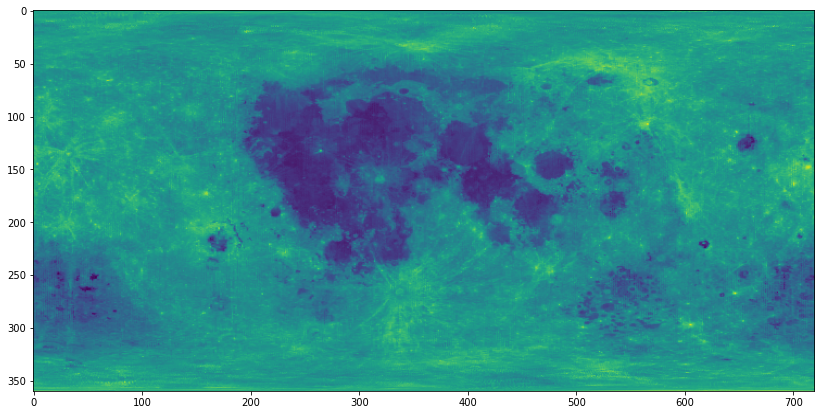

In [7]:
response = urllib.request.urlopen('https://raw.githubusercontent.com/giorgos314/gsoc-2021-mercury-albedo/main/Moon/Lola_Albedo.csv')
lines = [l.decode('utf-8') for l in response.readlines()]

albedo = np.genfromtxt(lines, delimiter=',')
albedo = np.flip(albedo, axis = 0) # the map in the CSV is flipped upside down, so we fix that

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(albedo, aspect='auto')

In [8]:
x_axis = [np.arange(-180, 180, 0.5)] # 0.5 cause 720/2 = 360
y_axis = [np.arange(90, -90, -0.5)] # -0.5 cause 360/2 = 180
xx, yy = np.meshgrid(x_axis, y_axis, indexing='xy')

In [9]:
np.shape(xx)

(360, 720)

In [10]:
xy = np.array(list(zip(xx, yy)))
xy = np.moveaxis(xy, 1, -1) # reorder the axes
np.shape(xy)

(360, 720, 2)

In [11]:
xy[150, 150, :] # returns long and lat values for the pixel at position [150, 150]

array([-105.,   15.])

In [12]:
from math import radians, cos, sin, asin, sqrt
def haversine(lat1, lon1, lat2, lon2, radius):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 

    km = radius * c
    return km

In [13]:
print(haversine(90, 0, -90, 0, 1739))
print(haversine(0, -180, 0, 0, 1739)*2)

5463.22962459265
10926.4592491853


In [14]:
# xy's shape is (360, 720, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: long, 1: lat]

distances = np.empty((360, 720, 2))

# traverse the entire albedo
for i in range(np.shape(xy)[0]-1): # 0 to 358 in this case (y axis)
    for j in range(np.shape(xy)[1]-1): # 0 to 718 in this case (x axis)
        # calculate pixel height in km using the pixel below the current one
        # reminder: haversine(lat1, lon1, lat2, lon2, radius)
        distances[i, j, 1] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i+1, j, 1], xy[i+1, j, 0], 1739)
        # calculate pixel width in km using the pixel to the right of the current one
        distances[i, j, 0] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i, j+1, 1], xy[i, j+1, 0], 1739)

# the method above fails to calculate values for the last row and last column
# we do that here:

# fixing the last row
for j in range(np.shape(xy)[1]): # 0 to 719 in this case (x axis)       
    distances[-1, j, 1] = haversine(xy[-1, j, 1], xy[-1, j, 0], xy[-2, j, 1], xy[-2, j, 0], 1739)

# fixing the last column
for i in range(np.shape(xy)[0]): # 0 to 359 in this case (y axis)
    distances[i, -1, 0] = haversine(xy[i, -1, 1], xy[i, -1, 0], xy[i, -2, 1], xy[i, -2, 0], 1739)

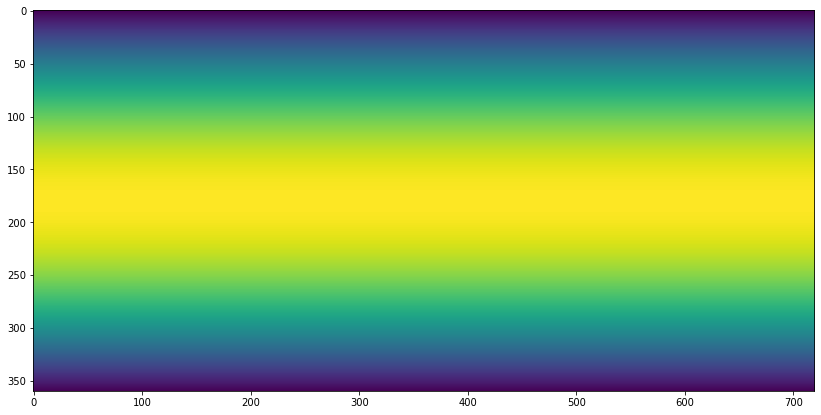

In [15]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(distances[:,:,0], aspect='auto')

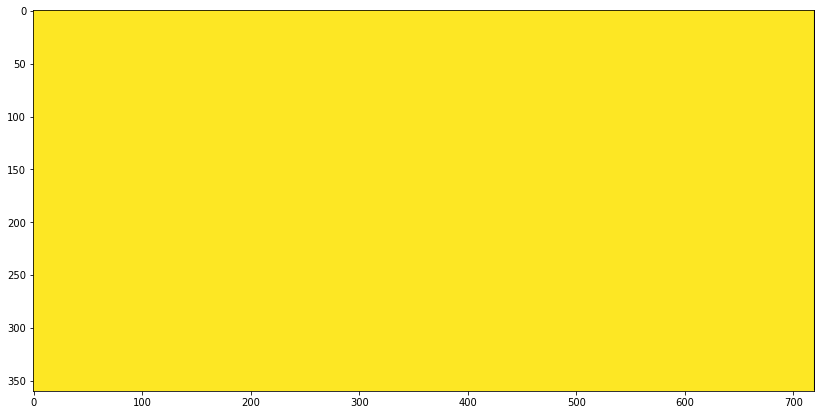

In [16]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(distances[:,:,1], aspect='auto')

In [17]:
import math

# diastances' shape is (360, 720, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: dist long, 1: dist lat]

def km_to_radius_x(km, x, y):
    '''Turns distances in km to distances in pixels'''
    # the reason this function is bounded to 360 is that the values for radius
    # on the poles go to infinity and break the algorithm
    if y == 0 or y == 359: return 360
    distance = distances[y, x, 0] 
    increment = int(km/distance) 
    
    return increment if increment < 360 else 360


def create_filter_2d_sep(radius, sigma):
    '''Create a 2D gaussian filter using the separabily property of the Gaussian kernel'''
    gauss = np.empty([2*radius+1, 1])
    center = int(radius)
    
    for pixel in range(2*radius+1):
    # Create a 1D matrix which essentialy is the Gaussian blur in one dimension
        x = abs(center-pixel)
        gaussian = (1/(math.sqrt(2*math.pi*sigma**2))) * (math.e ** ((-x**2)/(2*(sigma**2))))
        gauss[pixel] = gaussian

    # Inner product of the matrix with its transpose is mathematically equivalent
    # to the 2D gaussian kernel but executes faster
    gauss2d = gauss @ gauss.T

    return gauss2d/np.sum(gauss2d)

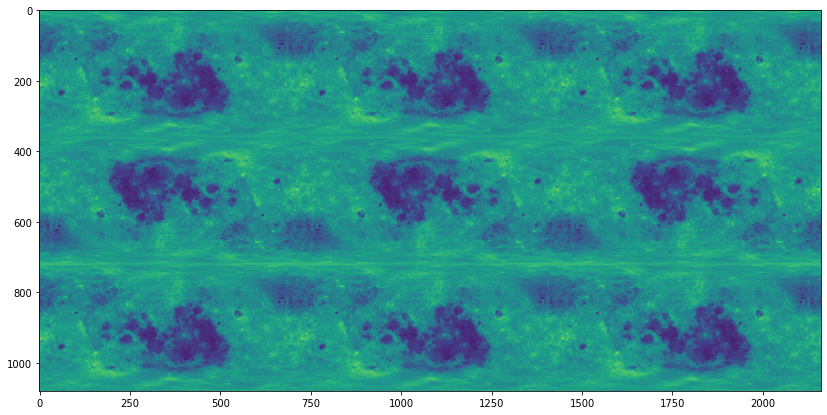

In [18]:
alb_pad = np.flip(albedo, axis = 0)
alb_pad = np.flip(alb_pad, axis = 1)
padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

layer2 = np.concatenate((albedo, albedo, albedo), axis=1)

newimg = np.concatenate((padding, layer2, padding), axis=0)

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(newimg, aspect='auto')

In [19]:
def adaptive_gauss(km, img):
    '''Adaptive gaussian blurring'''
    lat, lon = np.shape(img)
    fail = []
    radii = []
    sigmas = []

    # creating the grid of maps
    alb_pad = np.flip(img, axis = 0)
    alb_pad = np.flip(alb_pad, axis = 1)
    padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

    layer2 = np.concatenate((img, img, img), axis=1)

    alb = np.concatenate((padding, layer2, padding), axis=0)

    xpad = lon
    ypad = lat

    for y in range(ypad, ypad+lat):
        radius = km_to_radius_x(km, 15, y-ypad)
        # sigma is calculated based on radius
        sigma = (radius-1)/2 if radius > 1 else 0.5
        sigma = 20 if sigma > 20 else sigma
        radii.append(radius)
        sigmas.append(sigma)
        # print(y, radius, sigma)
        filter = create_filter_2d_sep(radius, sigma)

        for x in range(xpad, xpad+lon):

            # selecting the pixels we want from the map and the filter
            uplim = y-radius
            downlim = y+radius+1
            leftlim = x-radius
            rightlim = x+radius+1

            fuplim = 0
            fdownlim = 2*radius+1
            fleftlim = 0
            frightlim = 2*radius+1         

            a = alb[uplim:downlim, leftlim:rightlim]
            b = filter[fuplim:fdownlim, fleftlim:frightlim]
            try:
                # applying the kernel
                img[y-ypad, x-xpad] = np.sum(np.multiply(a, b))
            except Exception as e:
                if y not in fail: fail.append(y)
                print(e)
                #print(y, x, np.shape(a), np.shape(b))

    if fail: print(fail)
    return img, radii, sigmas

In [20]:
alb_test = np.array(albedo, copy=True)  
test, radii, sigmas = adaptive_gauss(120, alb_test)

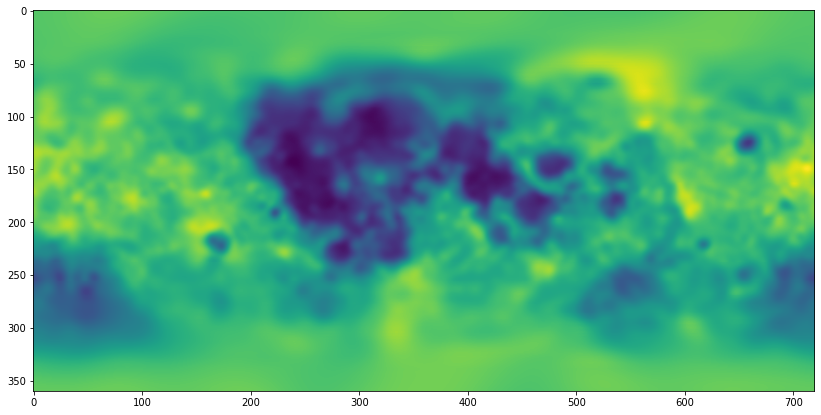

In [21]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(test, aspect='auto')

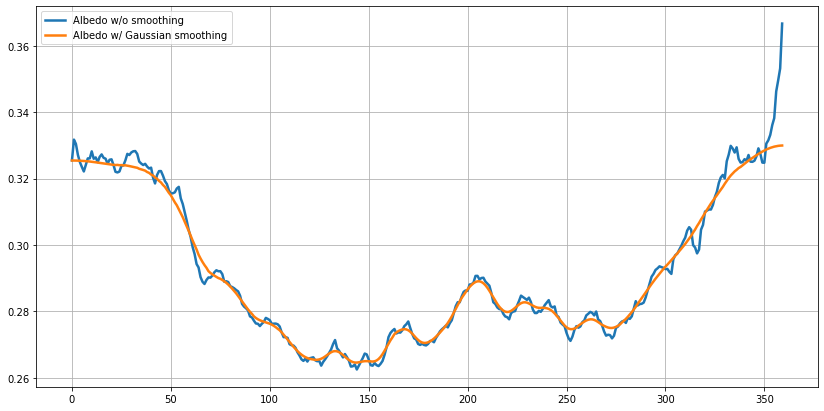

In [22]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.plot([x.mean() for x in albedo[:][:]], linewidth=2.5)
ax.plot([x.mean() for x in test[:][:]], linewidth=2.5)
ax.legend(["Albedo w/o smoothing", "Albedo w/ Gaussian smoothing"])
ax.grid()

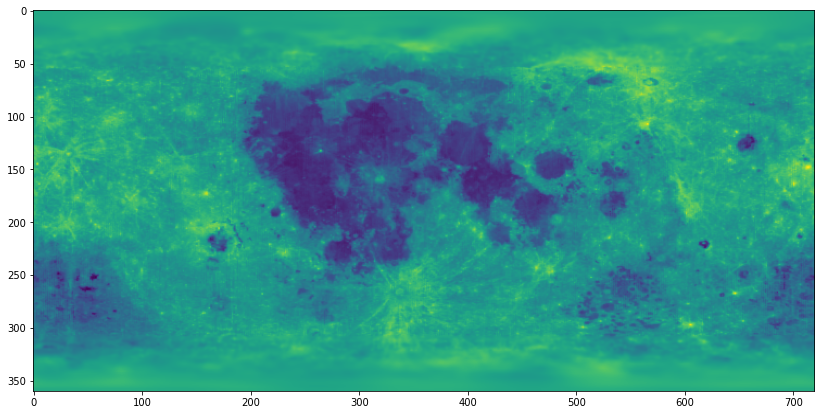

In [23]:
alb_test = np.array(albedo, copy=True)  
test = adaptive_gauss(20, alb_test)[0]

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(test, aspect='auto')
     

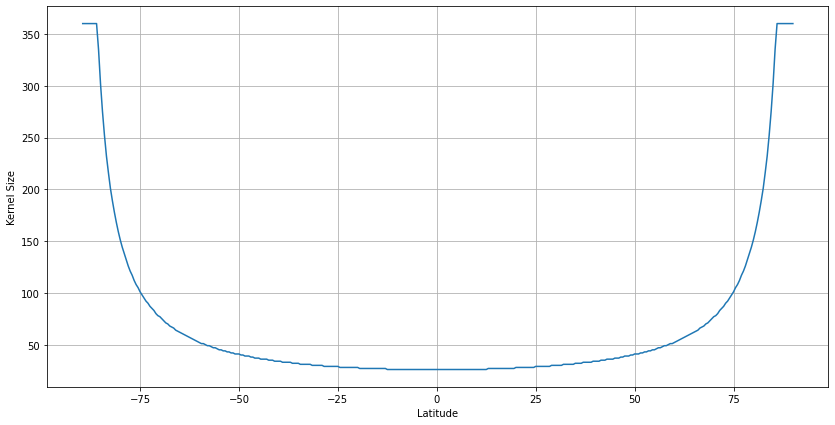

In [24]:
radii = []

for y in range(360):
    radius = km_to_radius_x(400, 250, y)
    radii.append(radius)

fig, ax = plt.subplots(figsize=(14, 7))
plt.ylabel("Kernel Size")
plt.xlabel("Latitude")
plt.grid()
ax.plot(np.arange(90, -90, -0.5), radii)
     

In [25]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

moon = {} # storing the maps in a dictionary of numpy arrays

for m in maps:
    response = urllib.request.urlopen('https://raw.githubusercontent.com/giorgos314/gsoc-2021-mercury-albedo/main/Moon/' + m + '_Map.csv')
    lines = [l.decode('utf-8') for l in response.readlines()]
    moon[m] = np.genfromtxt(lines, delimiter=',')

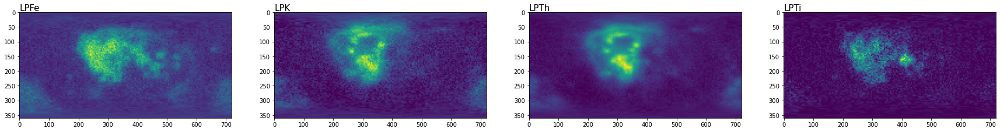

In [26]:
fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    axs[m].imshow(moon[maps[m]]) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

In [27]:
X_train = pd.DataFrame()
X_test = pd.DataFrame()

for m in maps:
    left, right = map_splitter(moon[m]) # split and flatten each map
    X_train = pd.concat([X_train, left], axis = 1)
    X_test = pd.concat([X_test, right], axis = 1)

X_train.columns = maps
X_test.columns = maps
X_train

,LPFe,LPK,LPTh,LPTi
0,4.04409,788.81,1.26750,0.190154
1,4.04409,788.81,1.26750,0.190154
2,4.04409,788.81,1.26750,0.190154
3,4.04409,788.81,1.26750,0.190154
4,4.04409,788.81,1.26750,0.190154
...,...,...,...,...
129595,3.82753,455.07,0.79856,0.112137
129596,3.82753,455.07,0.79856,0.112137
129597,3.82753,455.07,0.79856,0.112137
129598,3.82753,455.07,0.79856,0.112137


In [28]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)
xgb_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.1, n_estimators = 30, max_depth = 5)

srange = [x/10 for x in range(2, 100, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (0, 0), s)
    y_trains, y_tests = map_splitter(alb) 
    xgb_reg.fit(X_train, np.ravel(y_trains))
    pred = xgb_reg.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

In [29]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)
xgb_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.1, n_estimators = 30, max_depth = 5)

srange = [x for x in range(1, 100, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (s, s), 5)
    y_trains, y_tests = map_splitter(alb) 
    xgb_reg.fit(X_train, np.ravel(y_trains))
    pred = xgb_reg.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

In [30]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)
xgb_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.1, n_estimators = 30, max_depth = 5)

srange = [x for x in range(11, 40, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (s, s), 5)
    y_trains, y_tests = map_splitter(alb) 
    xgb_reg.fit(X_train, np.ravel(y_trains))
    pred = xgb_reg.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

MSE:0.0009705349048590786
RMSE:0.031153409201226737
MAE:0.024056209221390294
r^2:0.5684801297562053


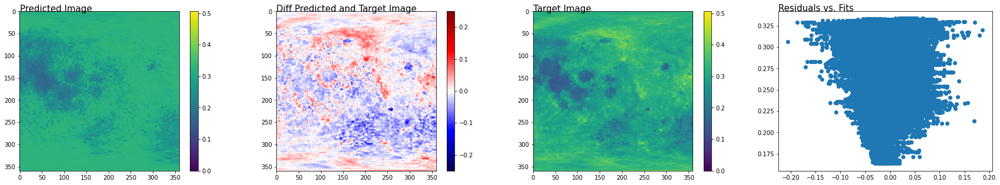

In [31]:
y_trains, y_tests = map_splitter(albedo) 
map_scoring(y_test, pred.reshape(-1, 1));

MSE:0.0005598775113257583
RMSE:0.02366173094525754
MAE:0.018514419300815432
r^2:0.6726609046614266


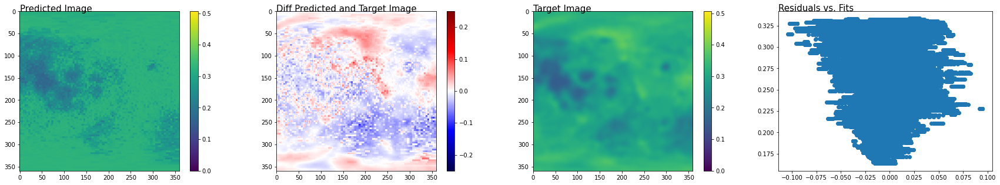

In [32]:
alb = cv2.GaussianBlur(albedo, (31, 31), 5)
y_trains, y_tests = map_splitter(alb) 
map_scoring(y_tests, pred.reshape(-1, 1));

In [33]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

srange = [x/10 for x in range(2, 100, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (0, 0), s)
    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

In [34]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

srange = [x for x in range(11, 40, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (s, s), 5)
    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

MSE:0.0009464541050002198
RMSE:0.030764494226302824
MAE:0.023805072154405475
r^2:0.5791869508900319


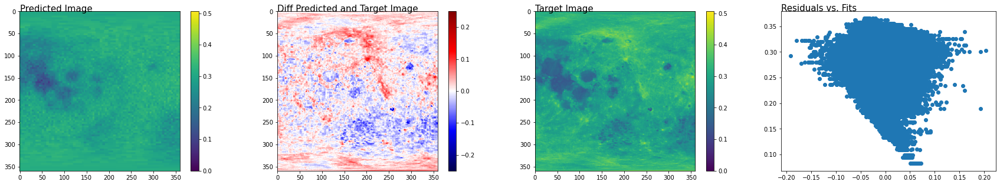

In [35]:
y_trains, y_tests = map_splitter(albedo) 
map_scoring(y_tests, pred.reshape(-1, 1));

MSE:0.0005324020846460489
RMSE:0.023073839833154104
MAE:0.018479305116392664
r^2:0.6887247420748648


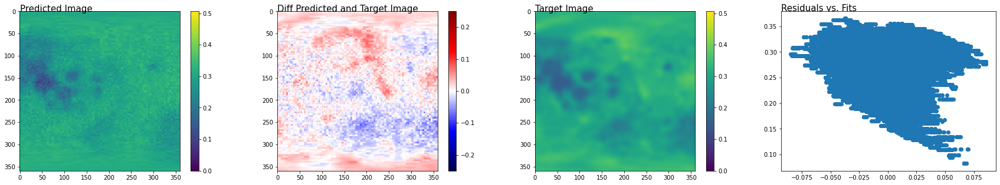

In [36]:
alb = cv2.GaussianBlur(albedo, (31, 31), 5)
y_trains, y_tests = map_splitter(alb) 
map_scoring(y_tests, pred.reshape(-1, 1));

In [37]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

kmrange = range(10, 500, 10)

for km in kmrange:
    alb_test = np.array(albedo, copy=True)  
    alb = adaptive_gauss(km, alb_test)[0]

    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())
     

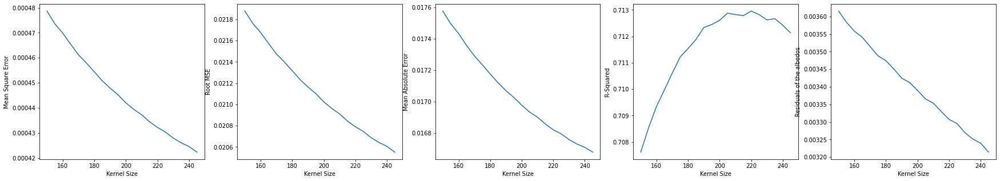

In [39]:
pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

kmrange = range(150, 250, 5)

for km in kmrange:
    alb_test = np.array(albedo, copy=True)  
    alb = adaptive_gauss(km, alb_test)[0]

    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

helper_ksize(kmrange, mses, rmses, maes, rsqs, residuals)

MSE:0.00036142500930702224
RMSE:0.019011181165488437
MAE:0.015614589862310695
r^2:0.6950024277151596


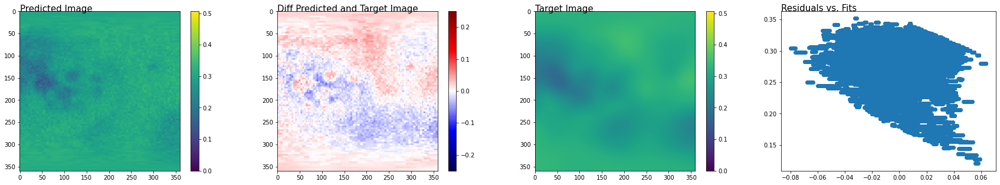

In [38]:
alb = adaptive_gauss(150, alb_test)[0]
y_trains, y_tests = map_splitter(alb) 
map_scoring(y_tests, pred.reshape(-1, 1));

In [40]:
from itertools import chain

maps = ['mgsimap', 'alsimap', 'ssimap', 'fesimap', 'casimap']
merc_albedo = ['mercury-albedo-resized-bottom-half', 'mercury-albedo-top-half']

mercury = {} # storing the maps in a dictionary of numpy arrays

for m in chain(maps, merc_albedo):
    response = urllib.request.urlopen('https://raw.githubusercontent.com/giorgos314/gsoc-2021-mercury-albedo/main/Mercury/' + m + '.csv')
    lines = [l.decode('utf-8') for l in response.readlines()]
    mercury[m] = np.genfromtxt(lines, delimiter=',')

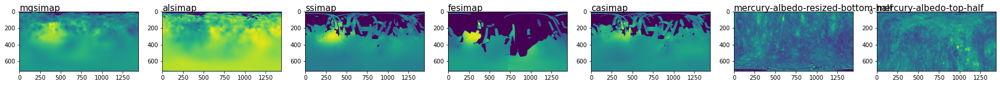

In [41]:
maps = list(mercury.keys())
fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    axs[m].imshow(mercury[maps[m]])
    axs[m].text(0, -5, maps[m], fontsize=15)

plt.show()

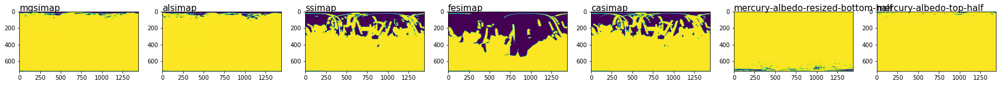

In [42]:
fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))


for m in range(len(maps)):
    axs[m].imshow(np.where(mercury[maps[m]]==0, -100, mercury[maps[m]]))
    axs[m].text(0, -5, maps[m], fontsize=15)

plt.show()

In [43]:
masks = {}

for m in range(len(maps)):
    # the albedo maps and the element maps need to have the same dimensions, hence the resizing
    stretched_map = np.repeat(mercury[maps[m]],2, axis=0)
    masks[maps[m]] = np.array([stretched_map == 0])[0,:,:]

masks

{'mgsimap': array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]),
 'alsimap': array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]),
 'ssimap': array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ Tru

In [44]:
a = np.logical_and(masks['fesimap'], masks['ssimap'])
b = np.logical_and(masks['alsimap'], a)
c = np.logical_and(masks['mgsimap'], b)
d = np.logical_and(masks['casimap'], c)

final_mask_and_full = d

In [45]:
np.shape(final_mask_and_full)

(1440, 1440)

In [46]:
final_mask_and = final_mask_and_full[:720,:]
np.shape(final_mask_and)

(720, 1440)

In [47]:
masked = np.ma.array(mercury['mercury-albedo-top-half'], mask = final_mask_and)

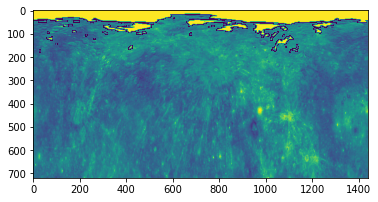

In [48]:
plt.imshow(final_mask_and)
plt.imshow(masked)

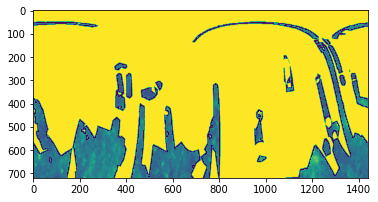

In [49]:
a = np.logical_or(masks['fesimap'], masks['ssimap'])
b = np.logical_or(masks['alsimap'], a)
c = np.logical_or(masks['mgsimap'], b)
d = np.logical_or(masks['casimap'], c)

final_mask_or_full = d
final_mask = final_mask_or_full[:720,:]
masked = np.ma.array(mercury['mercury-albedo-top-half'], mask = final_mask)
plt.imshow(final_mask)
plt.imshow(masked)

In [50]:
print(np.shape(final_mask))
print(np.shape(albedo))

(720, 1440)
(360, 720)


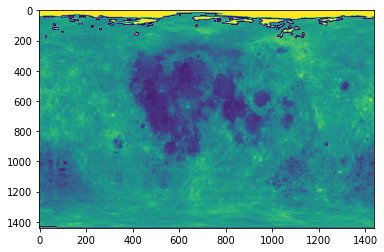

In [51]:
albedo_resized = np.repeat(albedo, 2, axis=1)
albedo_resized = np.repeat(albedo_resized, 4, axis=0)
plt.imshow(albedo_resized)
np.shape(albedo_resized)

masked = np.ma.array(albedo_resized, mask = final_mask_and_full)
plt.imshow(final_mask_and_full, aspect='auto')
plt.imshow(masked, aspect='auto')

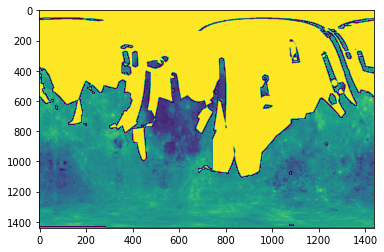

In [52]:
masked = np.ma.array(albedo_resized, mask = final_mask_or_full)
plt.imshow(final_mask_or_full, aspect='auto')
plt.imshow(masked, aspect='auto')

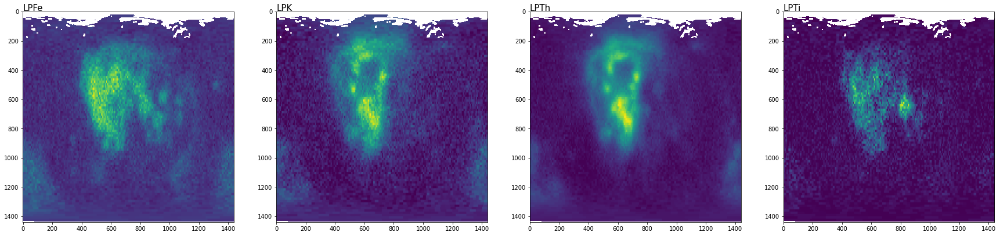

In [53]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    mapp = np.repeat(moon[maps[m]], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    axs[m].imshow(np.ma.array(mapp, mask = final_mask_and_full)) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

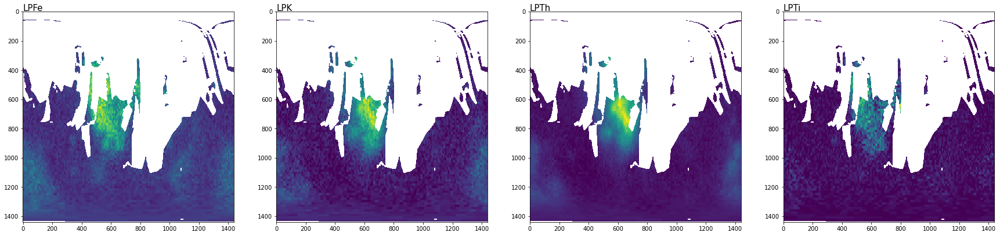

In [54]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    mapp = np.repeat(moon[maps[m]], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    axs[m].imshow(np.ma.array(mapp, mask = final_mask_or_full)) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

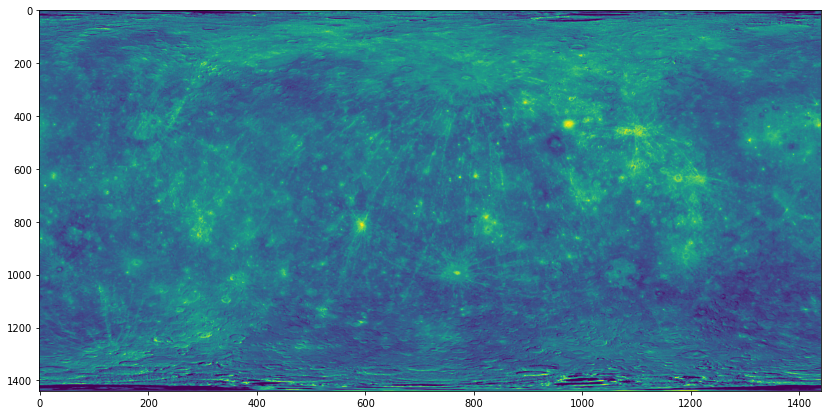

In [55]:
fullmerc = np.vstack([mercury['mercury-albedo-top-half'], mercury['mercury-albedo-resized-bottom-half']])

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(fullmerc, aspect='auto')

In [62]:
avgres = pd.read_csv('avgres3.csv', delimiter=',', index_col=0, names=['avgres'])
avgres

,avgres
1,31.73023
2,127.62668
3,202.88701
4,202.88701
5,220.16695
...,...
716,1766.72091
717,1784.00084
718,1784.00084
719,1792.64081


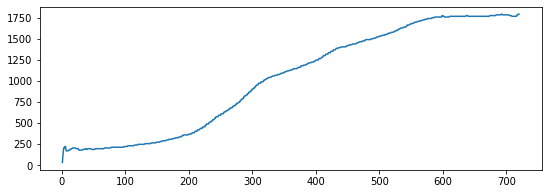

In [63]:
plt.figure(figsize=(9,3))
plt.plot(avgres.index, avgres['avgres'])

          avgres
0       31.73023
1       31.73023
2      127.62668
3      127.62668
4      202.88701
...          ...
1435  1784.00084
1436  1792.64081
1437  1792.64081
1438  1792.64081
1439  1792.64081

[1440 rows x 1 columns]


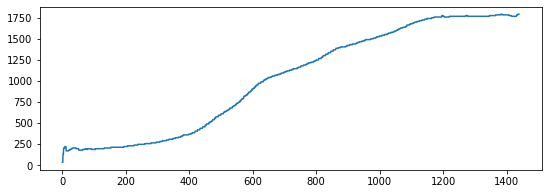

In [64]:
avgres1440 = pd.DataFrame(avgres['avgres'].repeat(2).reset_index())
avgres1440.drop(['index'], axis=1, inplace=True)
print(avgres1440)

plt.figure(figsize=(9,3))
plt.plot(avgres1440.index, avgres1440['avgres'])

,avgres
0,79.678455
1,202.887010
2,220.166950
3,168.327150
4,168.327150
...,...
355,1766.720910
356,1766.720910
357,1766.720910
358,1784.000840


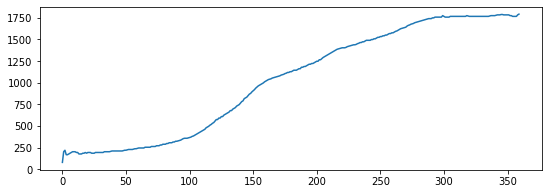

In [65]:
av = avgres['avgres']
avgres360 = ((av + av.shift(-1)) / 2)[::2]
avgres360 = pd.DataFrame(avgres360).reset_index()
avgres360.drop('index', axis=1, inplace=True)
display(avgres360)

plt.figure(figsize=(9,3))
plt.plot(avgres360.index, avgres360['avgres'])

(1440, 1440)
(1440, 1440, 2)


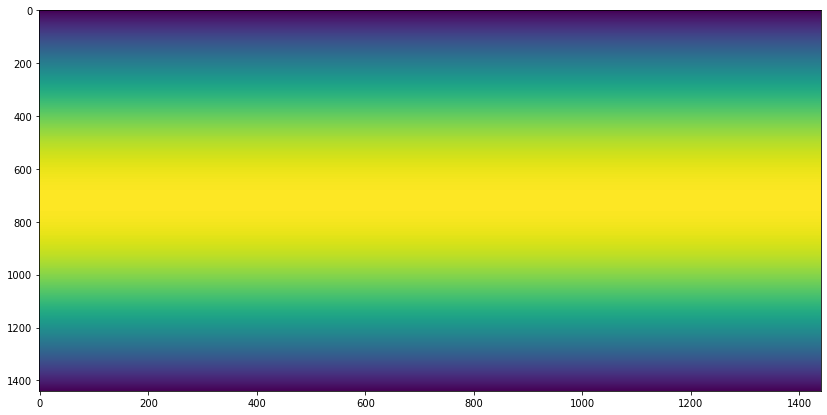

In [66]:
x_axis = [np.arange(-180, 180, 0.25)] # 0.25 cause 1440/4 = 360
y_axis = [np.arange(90, -90, -0.125)] # -0.5 cause 1440/8 = 180
xx, yy = np.meshgrid(x_axis, y_axis, indexing='xy')
print(np.shape(xx))

xy = np.array(list(zip(xx, yy)))
xy = np.moveaxis(xy, 1, -1) # reorder the axes
print(np.shape(xy))

# xy's shape is (1440, 1440, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: long, 1: lat]

distances3 = np.empty((1440, 1440, 2))

# traverse the entire albedo
for i in range(np.shape(xy)[0]-1): # y axis
    for j in range(np.shape(xy)[1]-1): # x axis
        # calculate pixel height in km using the pixel below the current one
        # reminder: haversine(lat1, lon1, lat2, lon2, radius)
        distances3[i, j, 1] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i+1, j, 1], xy[i+1, j, 0], 2439.7)
        # calculate pixel width in km using the pixel to the right of the current one
        distances3[i, j, 0] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i, j+1, 1], xy[i, j+1, 0], 2439.7)

# the method above fails to calculate values for the last row and last column
# we do that here:

# fixing the last row
for j in range(np.shape(xy)[1]): # x axis      
    distances3[-1, j, 1] = haversine(xy[-1, j, 1], xy[-1, j, 0], xy[-2, j, 1], xy[-2, j, 0], 2439.7)

# fixing the last column
for i in range(np.shape(xy)[0]): # y axis
    distances3[i, -1, 0] = haversine(xy[i, -1, 1], xy[i, -1, 0], xy[i, -2, 1], xy[i, -2, 0], 2439.7)

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(distances3[:,:,0], aspect='auto')

In [67]:
import math
radius = 3
sigma = 1

# diastances' shape is (360, 720, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: dist long, 1: dist lat]

def km_to_radius_x(y):
    '''Turns distances in km to distances in pixels'''
    # the reason this function is bounded to 1440 is that the values for radius
    # on the poles go to infinity and break the algorithm
    km = avgres1440['avgres'][y]
    distance = distances3[y, 5, 1]
    # print(y, km, distance)
    increment = int(km/distance) 
    # increment = increment if increment % 2 > 0 else increment + 1
    increment = int(increment/2.335)

    return increment if increment < 180 else 180


def create_filter_2d_sep(radius, sigma):
    '''Create a 2D gaussian filter using the separabily property of the Gaussian kernel'''
    gauss = np.empty([2*radius+1, 1])
    center = int(radius)
    
    for pixel in range(2*radius+1):
    # Create a 1D matrix which essentialy is the Gaussian blur in one dimension
        x = abs(center-pixel)
        gaussian = (1/(math.sqrt(2*math.pi*sigma**2))) * (math.e ** ((-x**2)/(2*(sigma**2))))
        gauss[pixel] = gaussian

    # Inner product of the matrix with its transpose is mathematically equivalent
    # to the 2D gaussian kernel but executes faster
    gauss2d = gauss @ gauss.T

    return gauss2d/np.sum(gauss2d)

In [68]:
def adaptive_gauss(img):
    '''Adaptive gaussian blurring'''
    lat, lon = np.shape(img)
    fail = []
    radii = []
    sigmas = []

    alb_pad = np.flip(img, axis = 0)
    alb_pad = np.flip(alb_pad, axis = 1)
    padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

    layer2 = np.concatenate((img, img, img), axis=1)

    alb = np.concatenate((padding, layer2, padding), axis=0)

    xpad = lon
    ypad = lat

    for y in range(ypad, ypad+lat):
        sigma = km_to_radius_x(y-ypad)
        radius = (2 * sigma) + 1
        # print(y-ypad, radius)
        # print("Radius: " + repr(radius))
        radii.append(radius)
        sigmas.append(sigma)
        filter = create_filter_2d_sep(radius, sigma)

        for x in range(xpad, xpad+lon):

            # general case
            uplim = y-radius
            downlim = y+radius+1
            leftlim = x-radius
            rightlim = x+radius+1

            fuplim = 0
            fdownlim = 2*radius+1
            fleftlim = 0
            frightlim = 2*radius+1         

            a = alb[uplim:downlim, leftlim:rightlim]
            b = filter[fuplim:fdownlim, fleftlim:frightlim]
            try:
                img[y-ypad, x-xpad] = np.sum(np.multiply(a, b))
            except Exception as e:
                if y not in fail: fail.append(y)
                print(e)
                # print(y, x)

    if fail: print(fail)
    return img, radii, sigmas

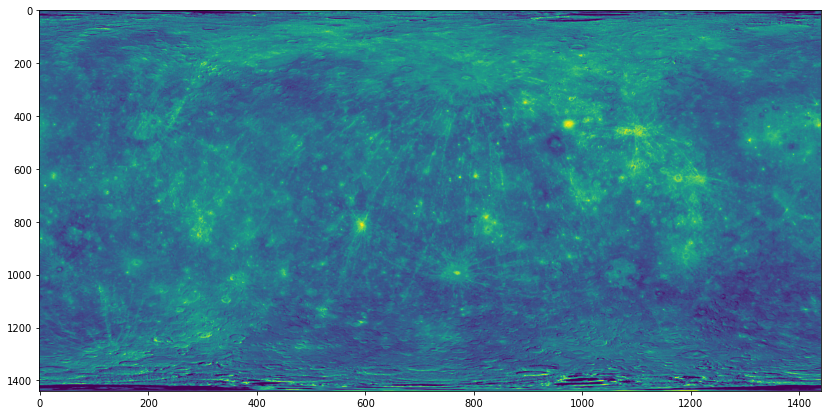

In [69]:
testmap = fullmerc.copy()

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(testmap, aspect='auto')

In [71]:
adapted, radii, sigmas = adaptive_gauss(testmap)

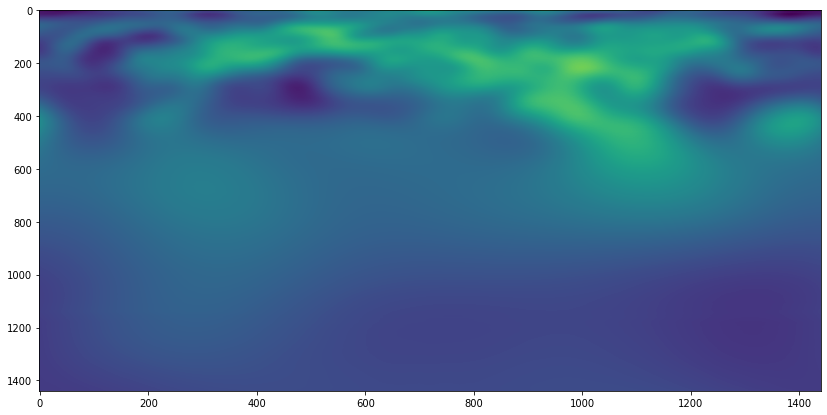

In [72]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(adapted, aspect='auto')

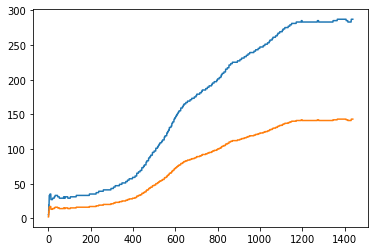

In [73]:
plt.plot(radii)
plt.plot(sigmas)

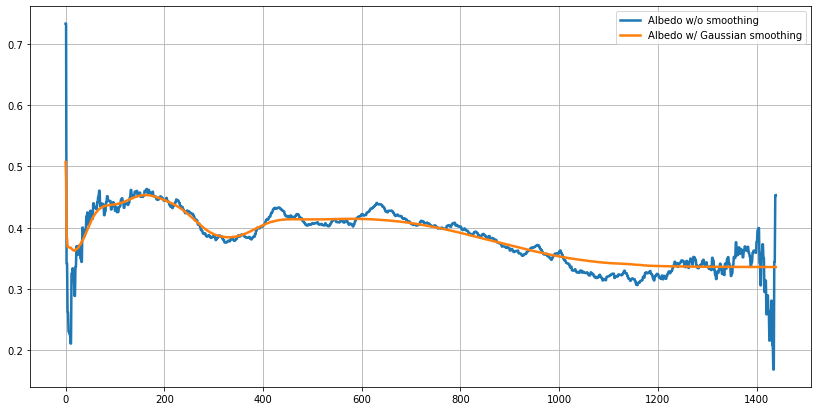

In [74]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.plot([x.mean() for x in fullmerc[:][:]], linewidth=2.5)
ax.plot([x.mean() for x in adapted[:][:]], linewidth=2.5)
ax.legend(["Albedo w/o smoothing", "Albedo w/ Gaussian smoothing"])
ax.grid()

In [75]:
def adaptive_gauss(img):
    '''Adaptive gaussian blurring'''
    lat, lon = np.shape(img)
    fail = []

    alb_pad = np.flip(img, axis = 0)
    alb_pad = np.flip(alb_pad, axis = 1)
    padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

    layer2 = np.concatenate((img, img, img), axis=1)

    alb = np.concatenate((padding, layer2, padding), axis=0)

    xpad = lon
    ypad = lat

    ratio = len(sigmas)/lat

    for y in range(ypad, ypad+lat):
        idx = int((y-lat)*ratio)
        sigma = sigmas[idx]
        radius = radii[idx]
        # print(y-ypad, radius)
        # print("Radius: " + repr(radius))
        filter = create_filter_2d_sep(radius, sigma)

        for x in range(xpad, xpad+lon):

            # general case
            uplim = y-radius
            downlim = y+radius+1
            leftlim = x-radius
            rightlim = x+radius+1

            fuplim = 0
            fdownlim = 2*radius+1
            fleftlim = 0
            frightlim = 2*radius+1         

            a = alb[uplim:downlim, leftlim:rightlim]
            b = filter[fuplim:fdownlim, fleftlim:frightlim]
            try:
                img[y-ypad, x-xpad] = np.sum(np.multiply(a, b))
            except Exception as e:
                if y not in fail: fail.append(y)
                print(e)
                # print(y, x)

    if fail: print(fail)
    return img    

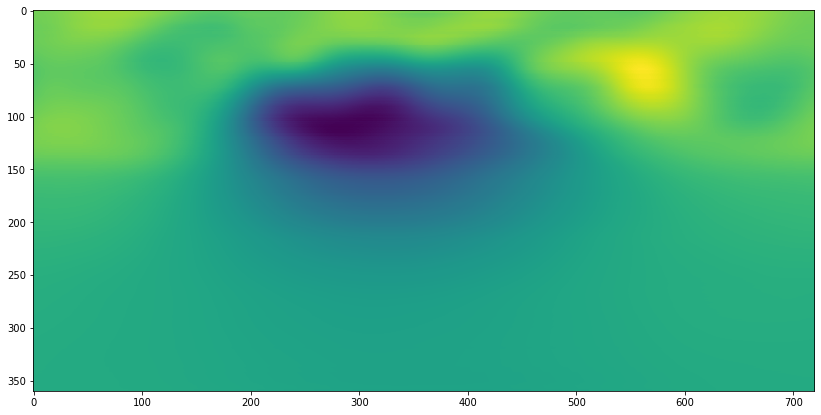

In [76]:
albedotest = albedo.copy()

albdtest = adaptive_gauss(albedotest)

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(albdtest, aspect='auto')

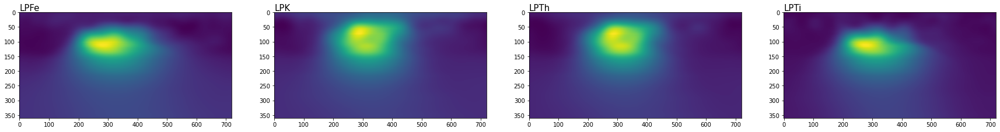

In [77]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))
blurred_elements = []

for m in range(len(maps)):

    moonmap = moon[maps[m]].copy()
    moonmap = adaptive_gauss(moonmap)
    blurred_elements.append(moonmap)

    axs[m].imshow(moonmap) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

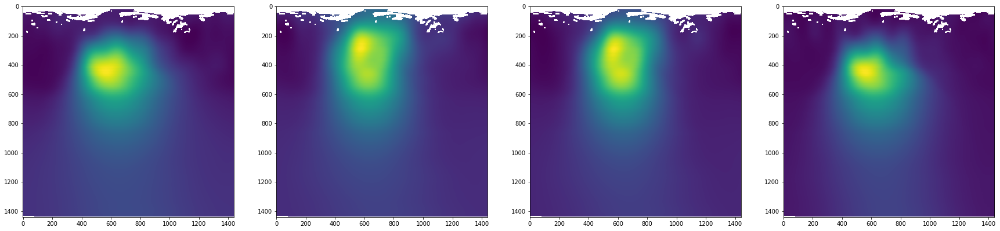

In [78]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    mapp = np.repeat(blurred_elements[m], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    axs[m].imshow(np.ma.array(mapp, mask = final_mask_and_full)) # display the map

plt.show()

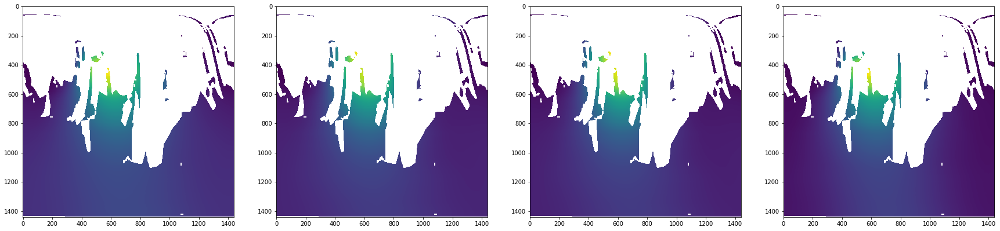

In [79]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))
blurred_elements_masked = []

for m in range(len(maps)):
    mapp = np.repeat(blurred_elements[m], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    mapp = np.ma.array(mapp, mask = final_mask_or_full)
    blurred_elements_masked.append(mapp)

    axs[m].imshow(np.ma.array(mapp, mask = final_mask_or_full)) # display the map

plt.show()

In [80]:
np.array_equal(blurred_elements_masked[0].data, blurred_elements_masked[1].data)

False

In [81]:
albdtest = np.repeat(albdtest, 2, axis=1)
albdtest = np.repeat(albdtest, 4, axis=0)

albdtestm = np.ma.array(albdtest, mask = final_mask_or_full)
     

data = albdtestm.data.flatten()
mask = albdtestm.mask.flatten()
yesdata = [] # the parts of the image where we have data
nodata = [] # the parts of the image where we don't have any data
l = len(data)

for i in range(l):
    if mask[i]: nodata.append(data[i])
    else: yesdata.append(data[i])

yesmappps = []
nomappps = []
for bem in range(len(blurred_elements_masked)):
    data = blurred_elements_masked[bem].data.flatten()
    mask = blurred_elements_masked[bem].mask.flatten()
    ydata = []
    ndata = []
    for i in range(l):
        if mask[i]: ndata.append(data[i])
        else: ydata.append(data[i])
    yesmappps.append(ydata)
    nomappps.append(ndata)

In [82]:
print(np.shape(yesdata))
print(np.shape(nodata))

(1160146,)
(913454,)


In [83]:
print(np.shape(yesmappps))
print(np.shape(nomappps))

(4, 1160146)
(4, 913454)


In [84]:
np.array_equal(yesmappps[0], yesmappps[1])

False

In [85]:
import xgboost as xgb 

preds = []

for i in range(4):
    xgb_reg = xgb.XGBRegressor(learning_rate = 0.1, n_estimators = 30, max_depth = 5)

    X_train = pd.DataFrame(yesdata)
    y_train = pd.DataFrame(yesmappps[i])

    xgb_reg.fit(X_train, y_train)

    X_test = pd.DataFrame(nodata)
    y_test = pd.DataFrame(nomappps[i])

    pred = xgb_reg.predict(X_test)
    preds.append(pred)

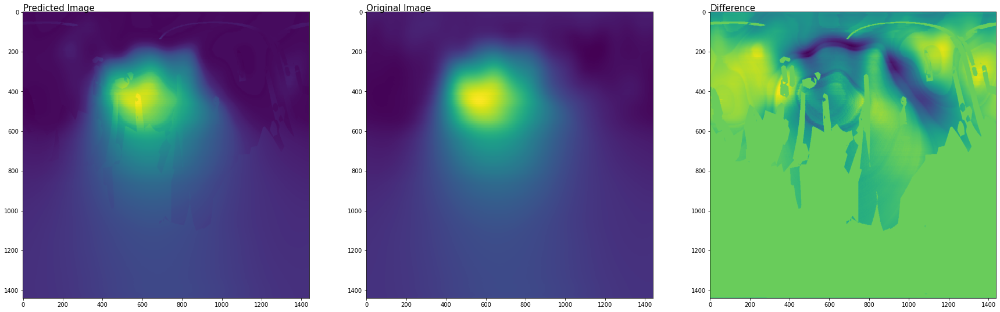

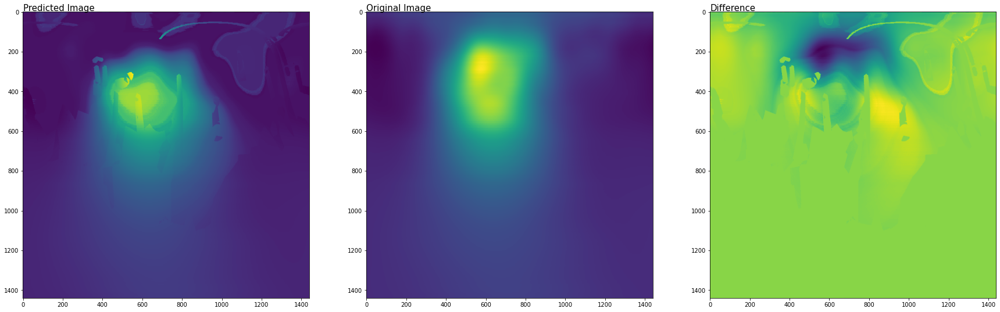

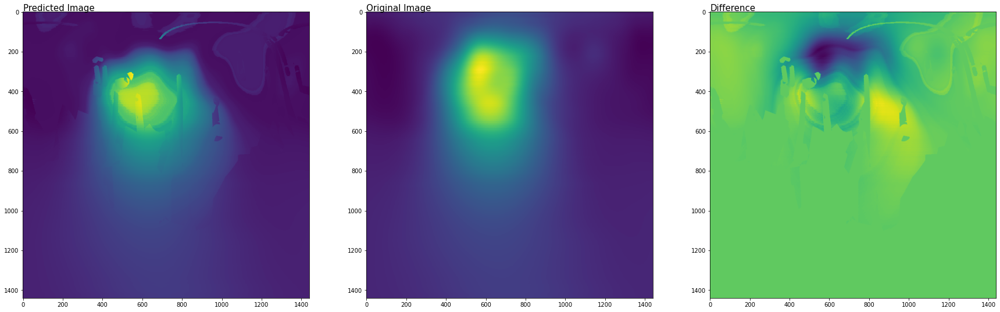

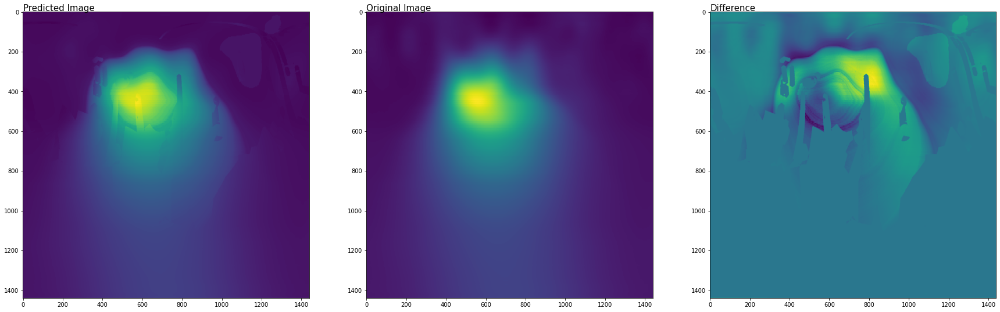

In [86]:
results = []

for p in range(len(preds)):
    img = []
    yescount = 0
    nocount = 0

    for i in range(l):
        if mask[i]: 
            img.append(preds[p][nocount])
            nocount += 1
        else: 
            img.append(yesmappps[p][yescount])
            yescount += 1

    img = np.reshape(img, (1440, 1440))
    results.append(img)

    fig, ax = plt.subplots(1, 3, figsize=(30, 14))
    ax[0].imshow(img)
    ax[0].text(0, -5, "Predicted Image", fontsize=15)
    blr = np.repeat(blurred_elements[p], 2, axis=1)
    blr = np.repeat(blr, 4, axis=0)
    ax[1].imshow(blr)
    ax[1].text(0, -5, "Original Image", fontsize=15)
    ax[2].imshow(img-blr)
    ax[2].text(0, -5, "Difference", fontsize=15)
    plt.show()

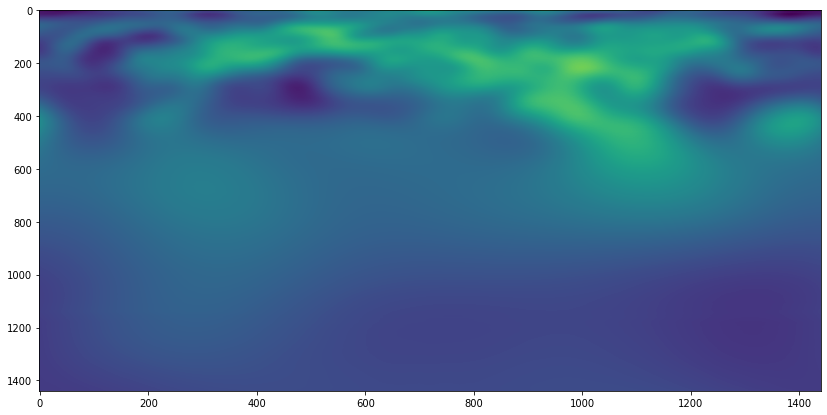

In [87]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(adapted, aspect='auto')

In [88]:
maps = ['mgsimap', 'alsimap', 'ssimap', 'fesimap', 'casimap']
mercmaps = []

for m in maps:
    mercmaps.append(mercury[m])
     

import xgboost as xgb 

predsmerc = []
merctrain = adapted.flatten()

for i in range(5):

    elmap = np.repeat(mercmaps[i], 2, axis=0)
    elmap = elmap.flatten()
    
    X_train = []
    X_test = []
    y_train = []

    for i in range(len(merctrain)):
        if elmap[i]: 
            X_train.append(merctrain[i])
            y_train.append(elmap[i])
        else: 
            X_test.append(merctrain[i])


    xgb_reg = xgb.XGBRegressor(learning_rate = 0.1, n_estimators = 30, max_depth = 5)

    X_train = pd.DataFrame(X_train)
    y_train = pd.DataFrame(y_train)

    xgb_reg.fit(X_train, y_train)

    X_test = pd.DataFrame(X_test)

    pred = xgb_reg.predict(X_test)
    predsmerc.append(pred)

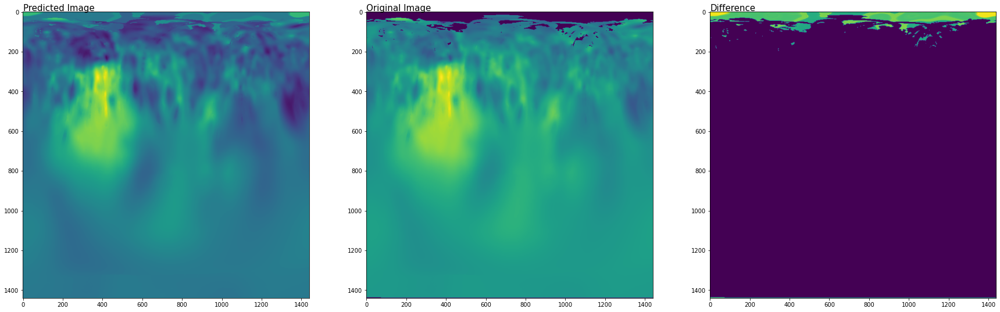

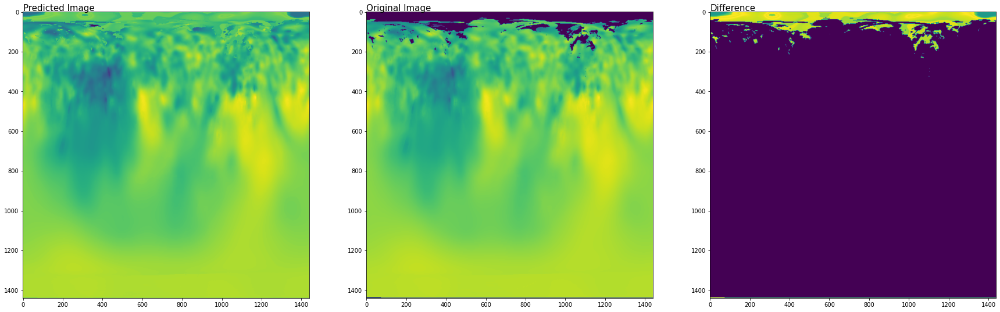

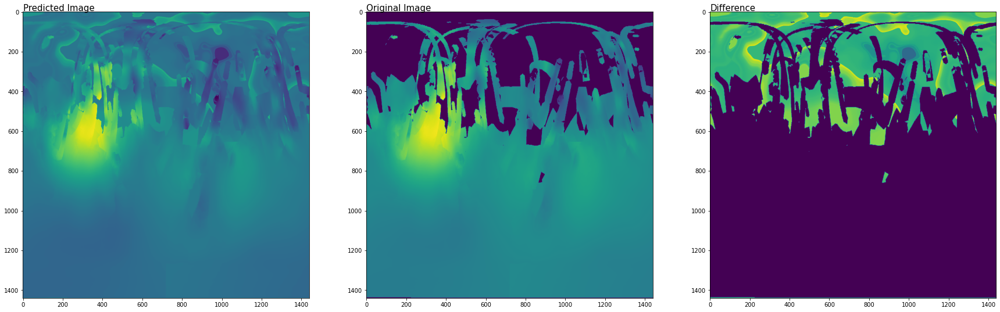

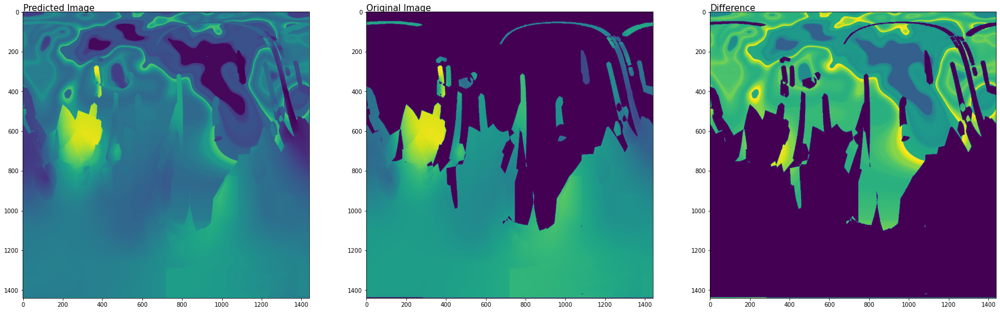

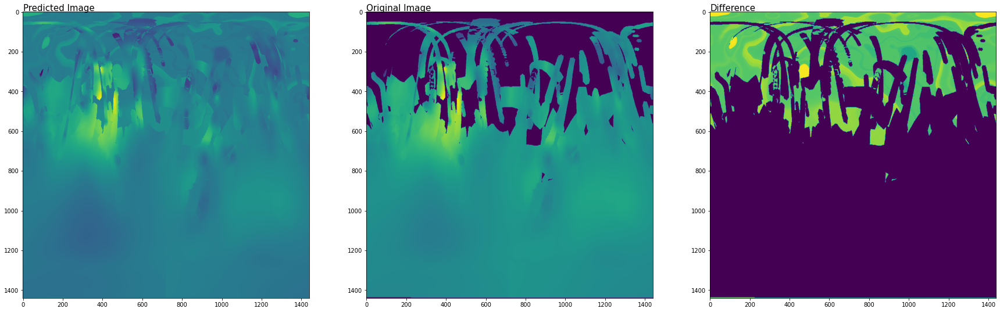

In [89]:
results = []

for p in range(len(predsmerc)):
    img = []
    yescount = 0
    nocount = 0

    elmap = np.repeat(mercmaps[p], 2, axis=0)
    elmap = elmap.flatten()

    for i in range(len(merctrain)):
        if elmap[i] != 0: 
            img.append(elmap[i])
        else:             
            img.append(predsmerc[p][nocount])
            nocount += 1
            
    img = np.reshape(img, (1440, 1440))
    results.append(img)

    fig, ax = plt.subplots(1, 3, figsize=(30, 14))
    ax[0].imshow(img)
    ax[0].text(0, -5, "Predicted Image", fontsize=15)
    blr = np.repeat(mercmaps[p], 2, axis=0)
    ax[1].imshow(blr)
    ax[1].text(0, -5, "Original Image", fontsize=15)
    ax[2].imshow(img-blr)
    ax[2].text(0, -5, "Difference", fontsize=15)
    plt.show()